<a href="https://colab.research.google.com/github/carlosrufinojunior/rah_master_thesis/blob/main/main_Code.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [2]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [6]:
import pandas as pd
df = pd.read_csv('/content/drive/MyDrive/63 - Master Thesis - Rah/62005005 Test Data.txt', sep='\t', header=0)
df

,Time[s]_RawFacilities,Dyno_Spd[mph],Dyno_TractiveForce[N],Dyno_LoadCell[N],Distance[mi],Dyno_Spd_Front[mph],Dyno_TractiveForce_Front[N],Dyno_LoadCell_Front[N],Dyno_Spd_Rear[mph],Dyno_LoadCell_Rear[N],...,VCRIGHT_cabinTempGlassRoof__C,VCRIGHT_cabinTempSideGlassLeft__C,VCRIGHT_cabinTempSideGlassRight__C,VCRIGHT_cabinTempWindshield__C,DAQ_time__s,VCFRONT_compressorState,VCFRONT_compDemandChiller__per,VCFRONT_compDemandEvap,VCRIGHT_hvacMassflowTarget__gps,VCRIGHT_solarLoadOnVehicle__Wpm2
0,-20.000,0.002,-12.445,-32.689,0.000,0.002,-9.608,-8.009,0.0,-24.680,...,23.0,23.0,23.0,23.0,-20.000,1.0,0.0,0.0,0.0,4.0
1,-19.900,0.001,-12.482,-33.015,0.000,0.001,-9.608,-7.975,0.0,-25.040,...,23.0,23.0,23.0,23.0,-19.900,1.0,0.0,0.0,0.0,4.0
2,-19.800,0.001,-12.446,-32.686,0.000,0.001,-9.592,-7.964,0.0,-24.722,...,23.0,23.0,23.0,23.0,-19.800,1.0,0.0,0.0,0.0,4.0
3,-19.700,0.001,-12.369,-33.350,0.000,0.001,-9.603,-7.623,0.0,-25.726,...,23.0,23.0,23.0,23.0,-19.700,1.0,0.0,0.0,0.0,4.0
4,-19.600,0.001,-12.449,-30.406,0.000,0.001,-9.608,-5.909,0.0,-24.498,...,23.0,23.0,23.0,23.0,-19.600,1.0,0.0,0.0,0.0,4.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
33009,3261.226,0.002,-12.415,-24.041,38.603,0.002,-9.594,-1.544,0.0,-22.497,...,21.0,21.0,21.0,21.0,3247.081,1.0,0.0,0.0,0.0,4.0
33010,3261.226,0.002,-12.415,-24.041,38.603,0.002,-9.594,-1.544,0.0,-22.497,...,21.0,21.0,21.0,21.0,3247.081,1.0,0.0,0.0,0.0,4.0
33011,3261.226,0.002,-12.415,-24.041,38.603,0.002,-9.594,-1.544,0.0,-22.497,...,21.0,21.0,21.0,21.0,3247.081,1.0,0.0,0.0,0.0,4.0
33012,3261.226,0.002,-12.415,-24.041,38.603,0.002,-9.594,-1.544,0.0,-22.497,...,21.0,21.0,21.0,21.0,3247.081,1.0,0.0,0.0,0.0,4.0


In [ ]:
df.describe

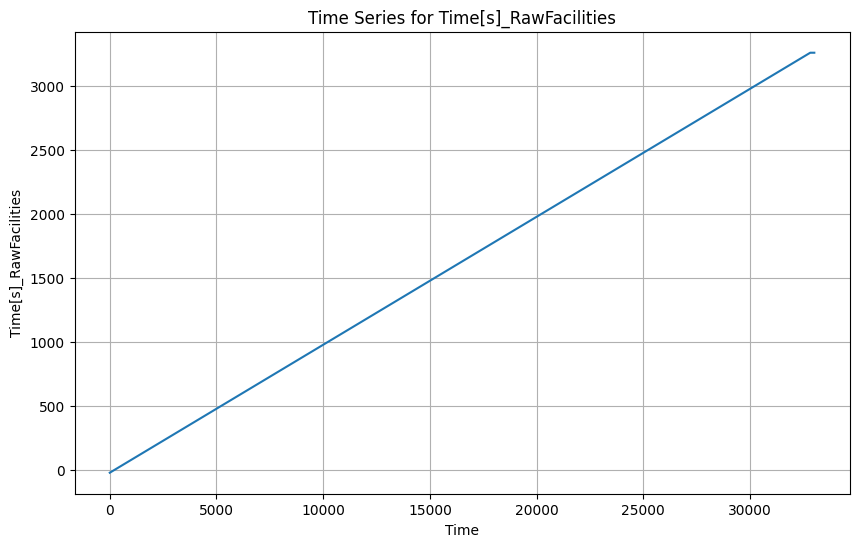

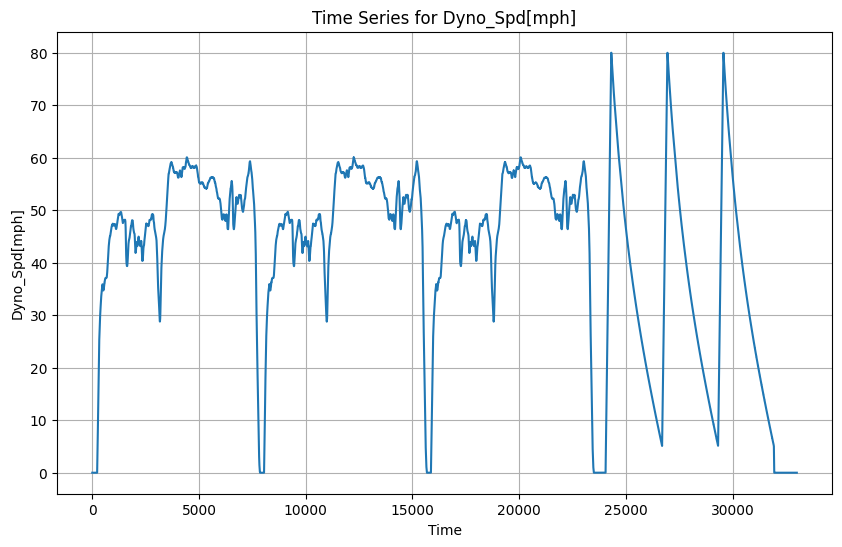

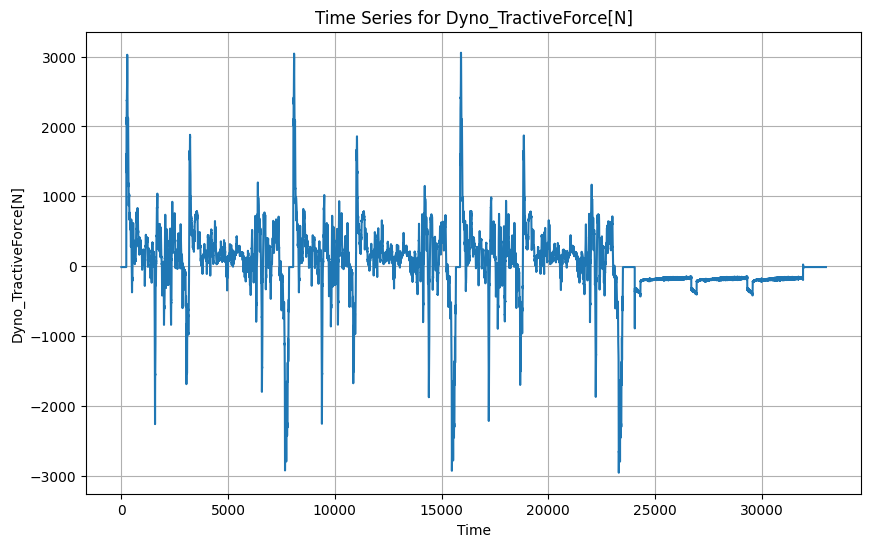

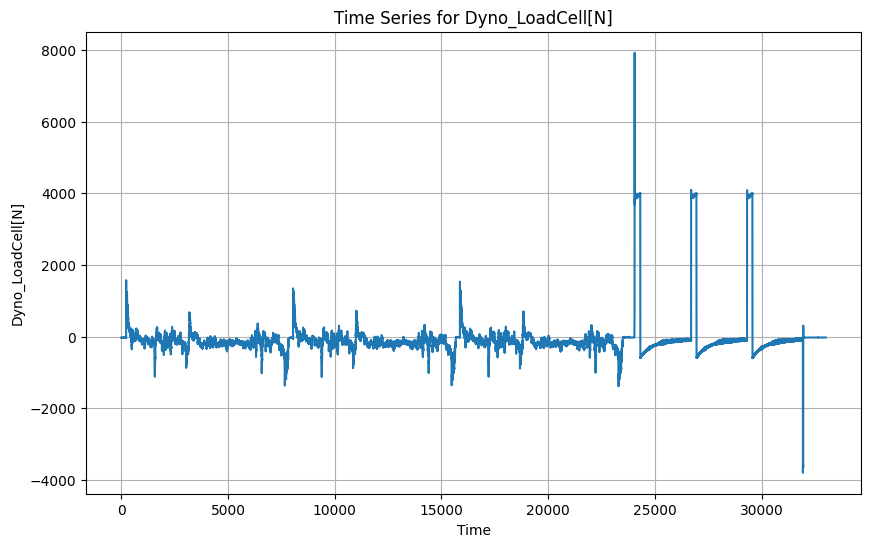

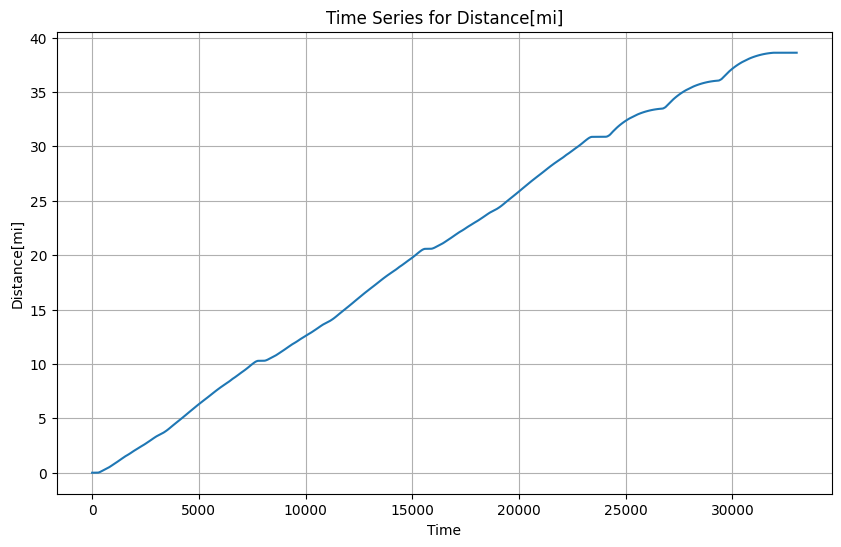

...

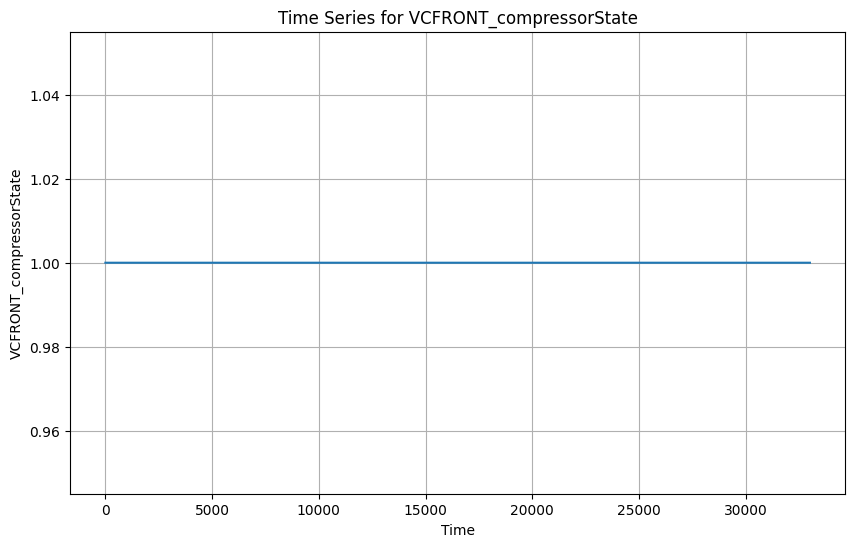

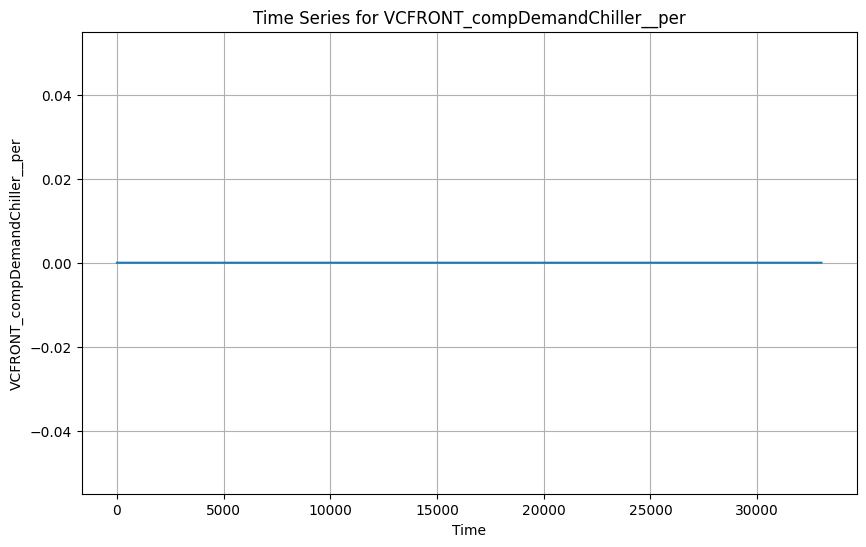

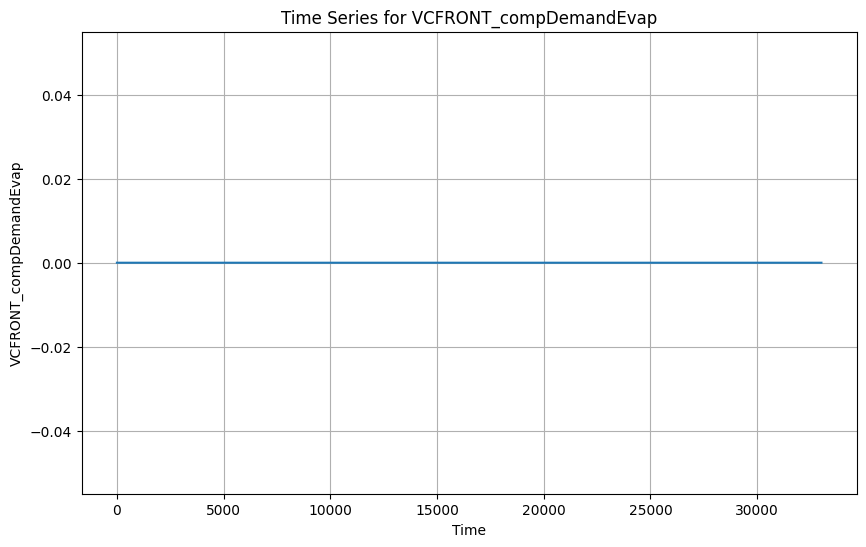

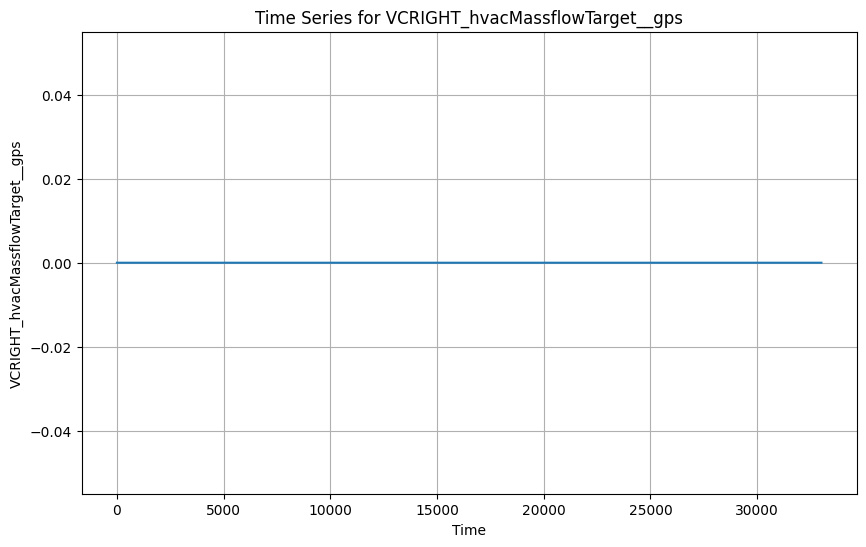

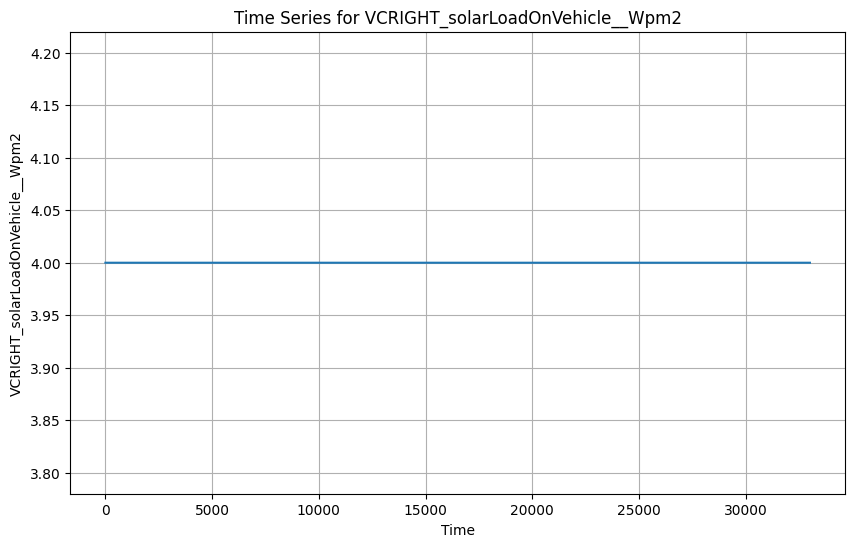

In [8]:
# prompt: generate the times series for each dataframe column

import matplotlib.pyplot as plt

# Assuming 'df' is already defined from the previous code snippet

for column in df.columns:
    if pd.api.types.is_numeric_dtype(df[column]):  # Check if the column is numeric
        plt.figure(figsize=(10, 6))
        plt.plot(df[column])
        plt.title(f'Time Series for {column}')
        plt.xlabel('Time')
        plt.ylabel(column)
        plt.grid(True)
        plt.show()
    else:
        print(f"Column '{column}' is not numeric and cannot be plotted as a time series.")

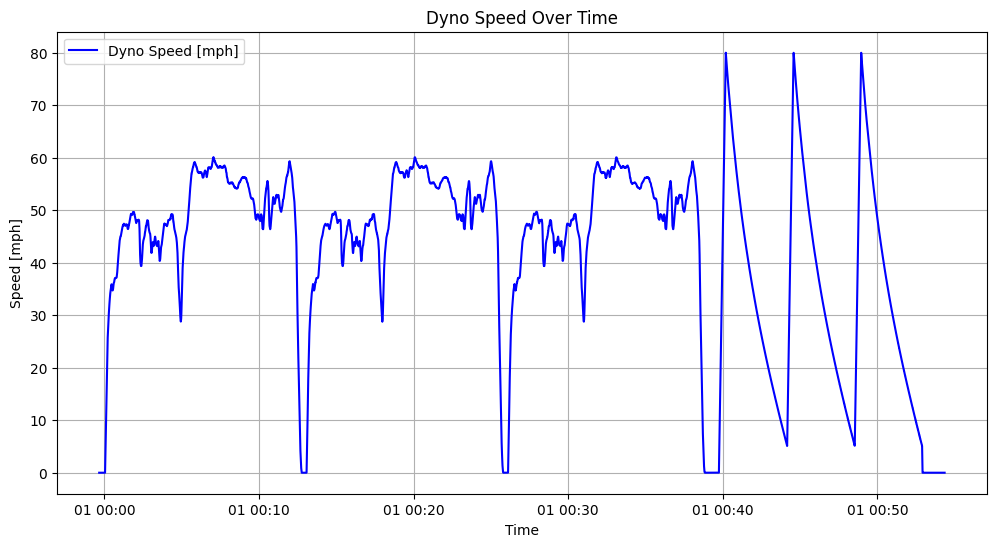

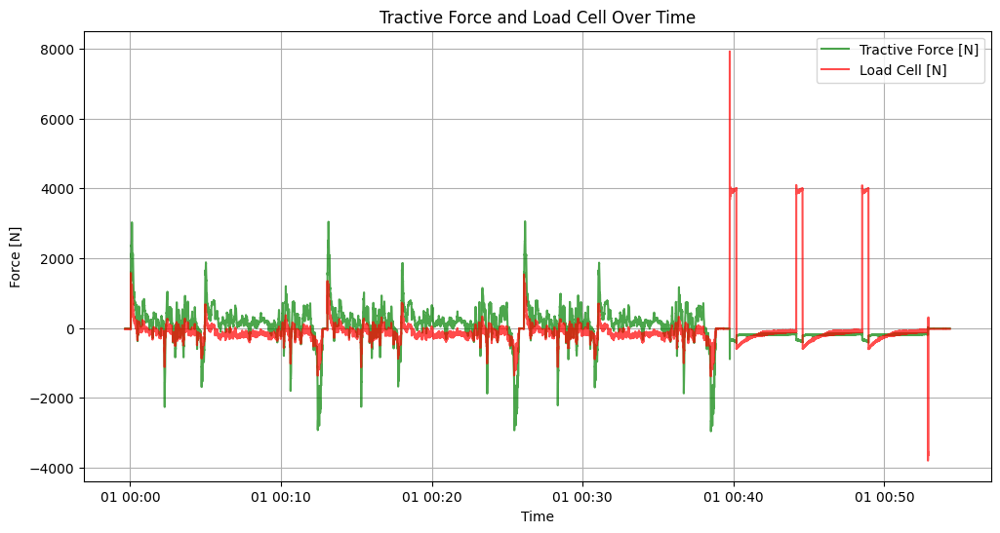

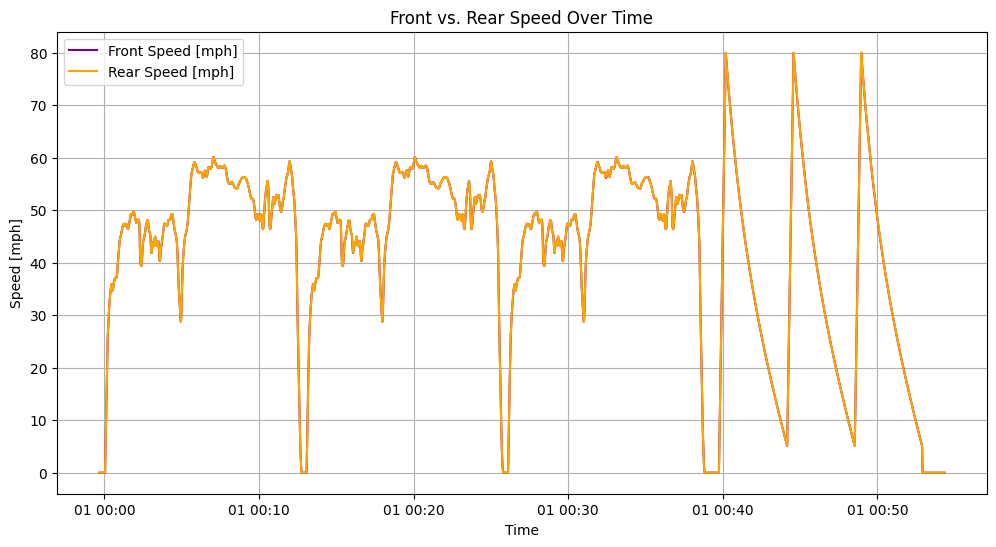

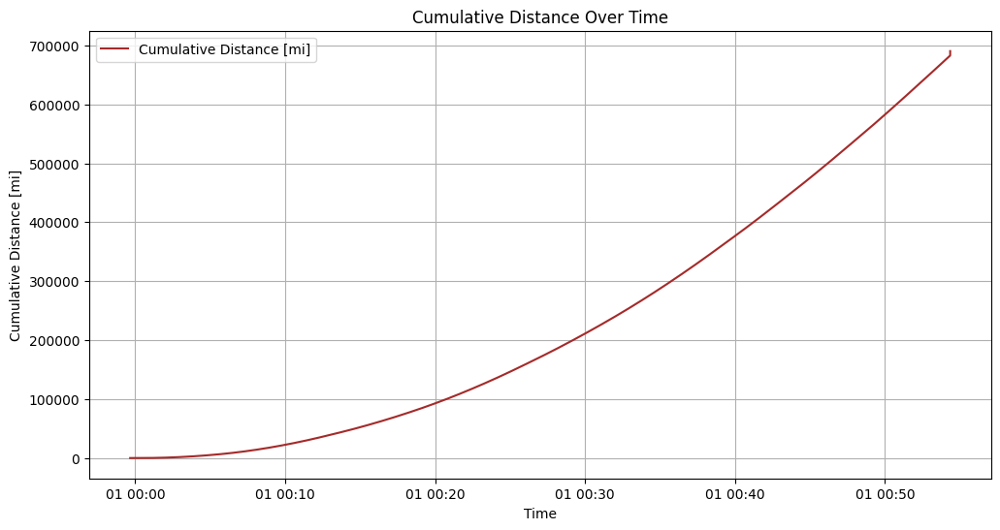

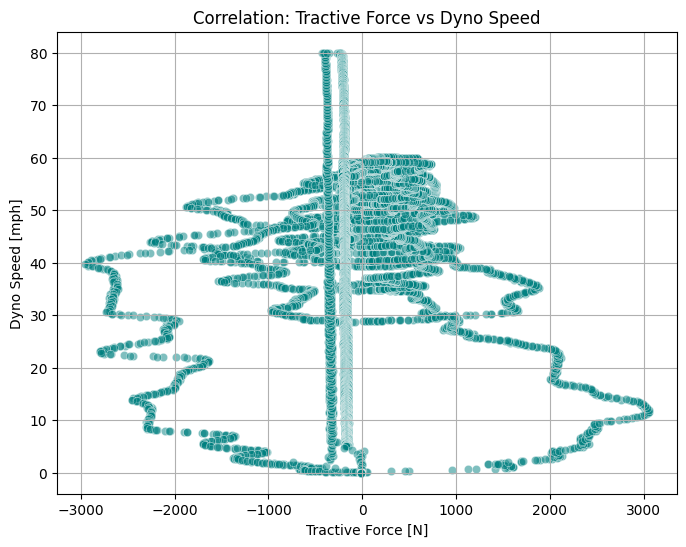

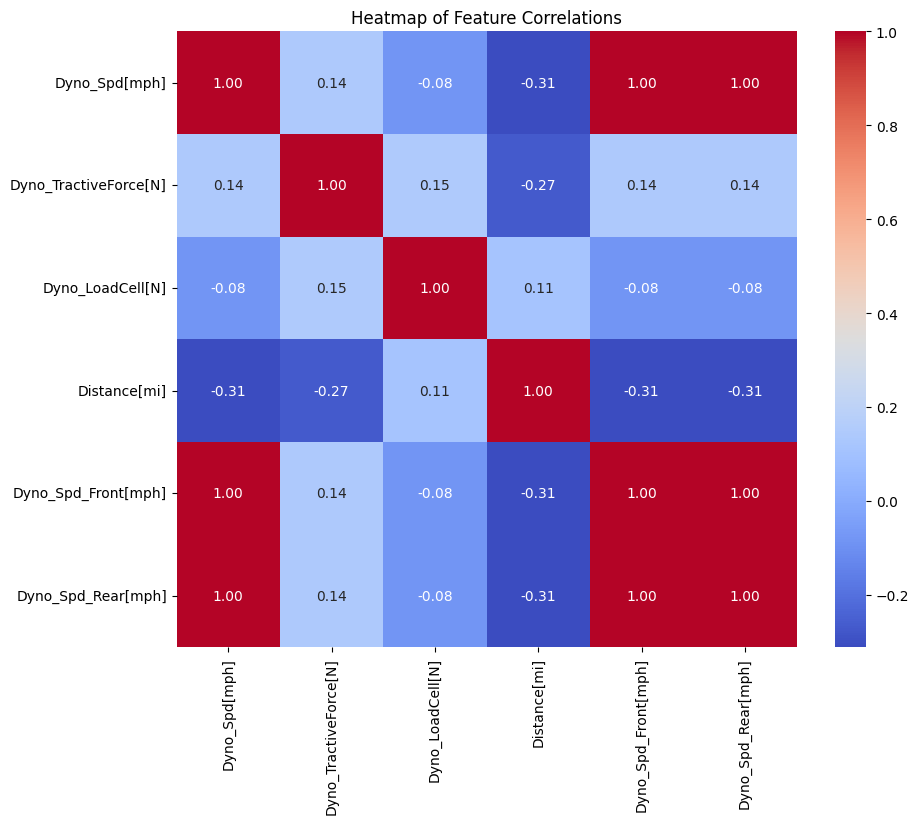

In [12]:
import matplotlib.pyplot as plt
import seaborn as sns

df = pd.read_csv('/content/drive/MyDrive/63 - Master Thesis - Rah/62005005 Test Data.txt', sep='\t', header=0)
df['Time[s]_RawFacilities'] = pd.to_datetime(df['Time[s]_RawFacilities'], unit='s', errors='coerce')

# Definir a coluna de tempo como índice
df.set_index('Time[s]_RawFacilities', inplace=True)

# Gráfico 1: Velocidade do dinamômetro ao longo do tempo
plt.figure(figsize=(12, 6))
plt.plot(df.index, df['Dyno_Spd[mph]'], label='Dyno Speed [mph]', color='blue')
plt.title('Dyno Speed Over Time')
plt.xlabel('Time')
plt.ylabel('Speed [mph]')
plt.legend()
plt.grid()
plt.show()

# Gráfico 2: Comparação de Força Trativa e Célula de Carga
plt.figure(figsize=(12, 6))
plt.plot(df.index, df['Dyno_TractiveForce[N]'], label='Tractive Force [N]', color='green', alpha=0.7)
plt.plot(df.index, df['Dyno_LoadCell[N]'], label='Load Cell [N]', color='red', alpha=0.7)
plt.title('Tractive Force and Load Cell Over Time')
plt.xlabel('Time')
plt.ylabel('Force [N]')
plt.legend()
plt.grid()
plt.show()

# Gráfico 3: Velocidades dianteira e traseira
plt.figure(figsize=(12, 6))
plt.plot(df.index, df['Dyno_Spd_Front[mph]'], label='Front Speed [mph]', color='purple')
plt.plot(df.index, df['Dyno_Spd_Rear[mph]'], label='Rear Speed [mph]', color='orange')
plt.title('Front vs. Rear Speed Over Time')
plt.xlabel('Time')
plt.ylabel('Speed [mph]')
plt.legend()
plt.grid()
plt.show()

# Gráfico 4: Distância acumulada
df['Cumulative_Distance[mi]'] = df['Distance[mi]'].cumsum()
plt.figure(figsize=(12, 6))
plt.plot(df.index, df['Cumulative_Distance[mi]'], label='Cumulative Distance [mi]', color='brown')
plt.title('Cumulative Distance Over Time')
plt.xlabel('Time')
plt.ylabel('Cumulative Distance [mi]')
plt.legend()
plt.grid()
plt.show()

# Gráfico 5: Correlação entre Força Trativa e Velocidade
plt.figure(figsize=(8, 6))
sns.scatterplot(x='Dyno_TractiveForce[N]', y='Dyno_Spd[mph]', data=df, alpha=0.5, color='teal')
plt.title('Correlation: Tractive Force vs Dyno Speed')
plt.xlabel('Tractive Force [N]')
plt.ylabel('Dyno Speed [mph]')
plt.grid()
plt.show()

# Gráfico 6: Heatmap de correlação entre variáveis principais
plt.figure(figsize=(10, 8))
corr = df[['Dyno_Spd[mph]', 'Dyno_TractiveForce[N]', 'Dyno_LoadCell[N]',
           'Distance[mi]', 'Dyno_Spd_Front[mph]', 'Dyno_Spd_Rear[mph]']].corr()
sns.heatmap(corr, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Heatmap of Feature Correlations')
plt.show()

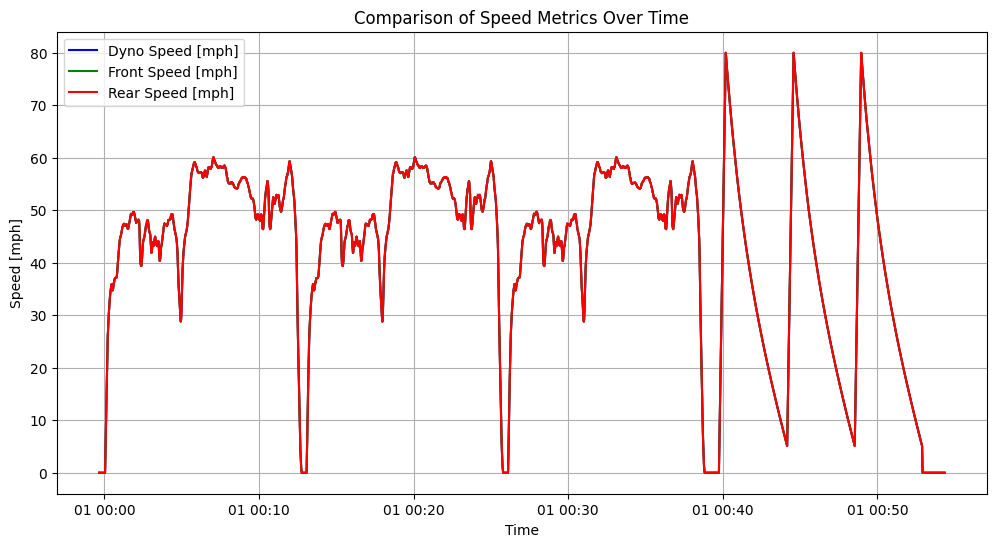

In [13]:
plt.figure(figsize=(12, 6))
plt.plot(df.index, df['Dyno_Spd[mph]'], label='Dyno Speed [mph]', color='blue')
plt.plot(df.index, df['Dyno_Spd_Front[mph]'], label='Front Speed [mph]', color='green')
plt.plot(df.index, df['Dyno_Spd_Rear[mph]'], label='Rear Speed [mph]', color='red')
plt.title('Comparison of Speed Metrics Over Time')
plt.xlabel('Time')
plt.ylabel('Speed [mph]')
plt.legend()
plt.grid()
plt.show()


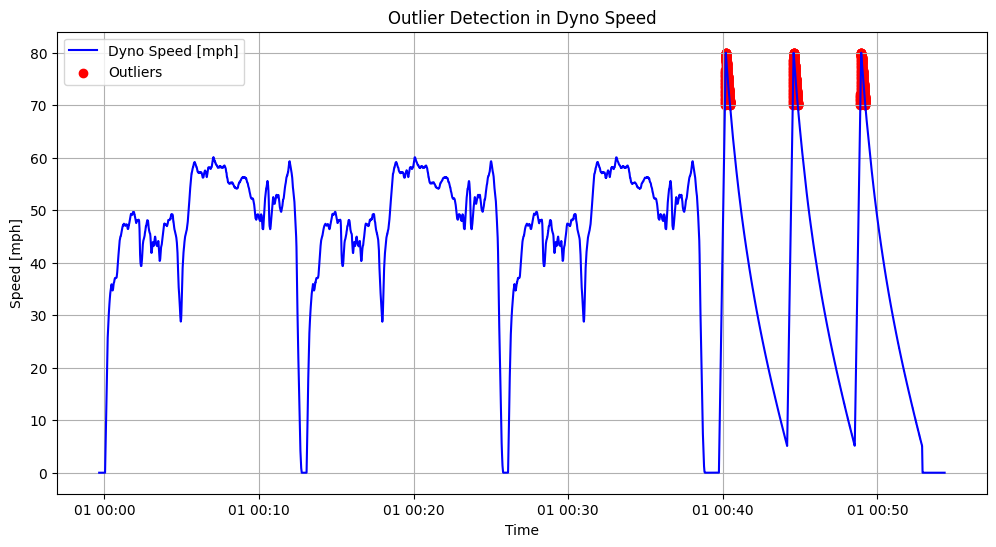

In [14]:
threshold = 70  # Exemplo de limite
outliers = df[df['Dyno_Spd[mph]'] > threshold]

plt.figure(figsize=(12, 6))
plt.plot(df.index, df['Dyno_Spd[mph]'], label='Dyno Speed [mph]', color='blue')
plt.scatter(outliers.index, outliers['Dyno_Spd[mph]'], color='red', label='Outliers')
plt.title('Outlier Detection in Dyno Speed')
plt.xlabel('Time')
plt.ylabel('Speed [mph]')
plt.legend()
plt.grid()
plt.show()


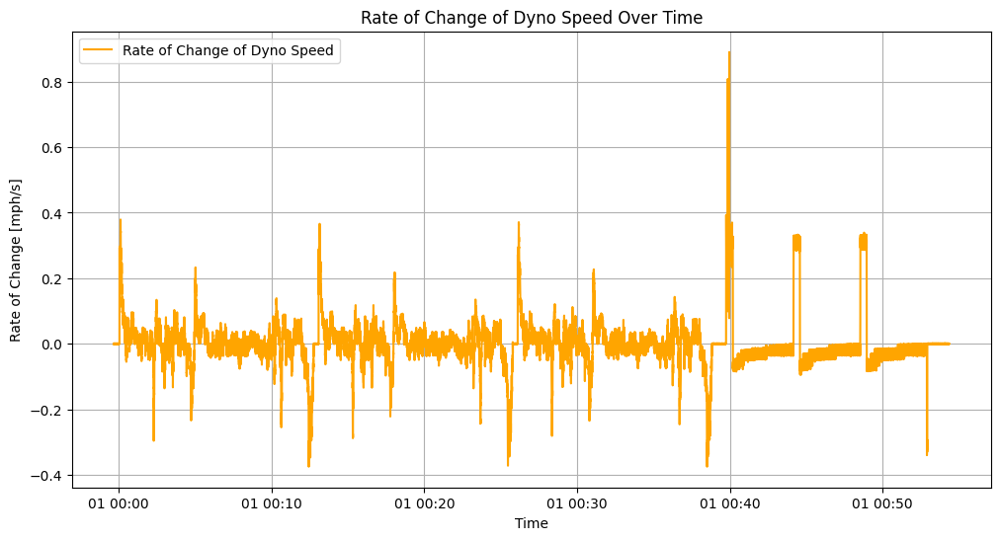

In [15]:
df['Dyno_Spd_Change'] = df['Dyno_Spd[mph]'].diff()

plt.figure(figsize=(12, 6))
plt.plot(df.index, df['Dyno_Spd_Change'], label='Rate of Change of Dyno Speed', color='orange')
plt.title('Rate of Change of Dyno Speed Over Time')
plt.xlabel('Time')
plt.ylabel('Rate of Change [mph/s]')
plt.legend()
plt.grid()
plt.show()


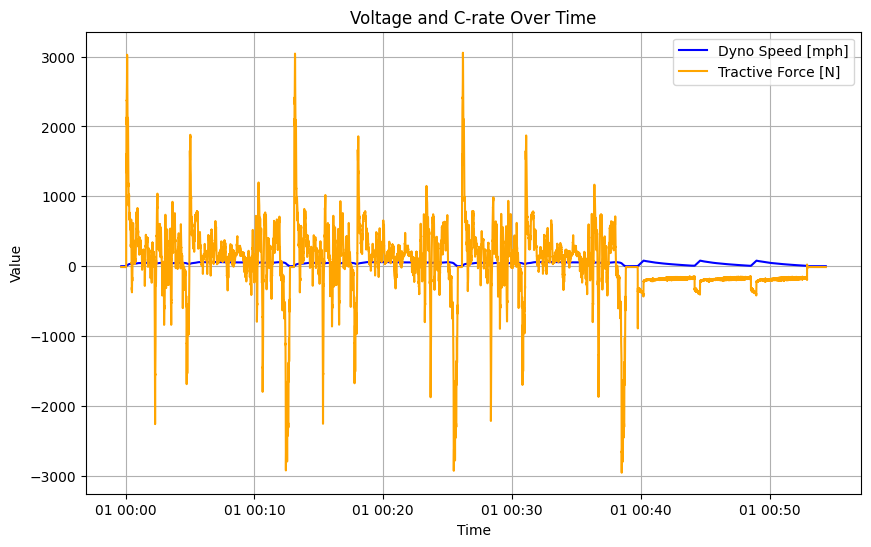

In [16]:
plt.figure(figsize=(10, 6))
plt.plot(df.index, df['Dyno_Spd[mph]'], label='Dyno Speed [mph]', color='blue')
plt.plot(df.index, df['Dyno_TractiveForce[N]'], label='Tractive Force [N]', color='orange')
plt.title('Voltage and C-rate Over Time')
plt.xlabel('Time')
plt.ylabel('Value')
plt.legend()
plt.grid()
plt.show()


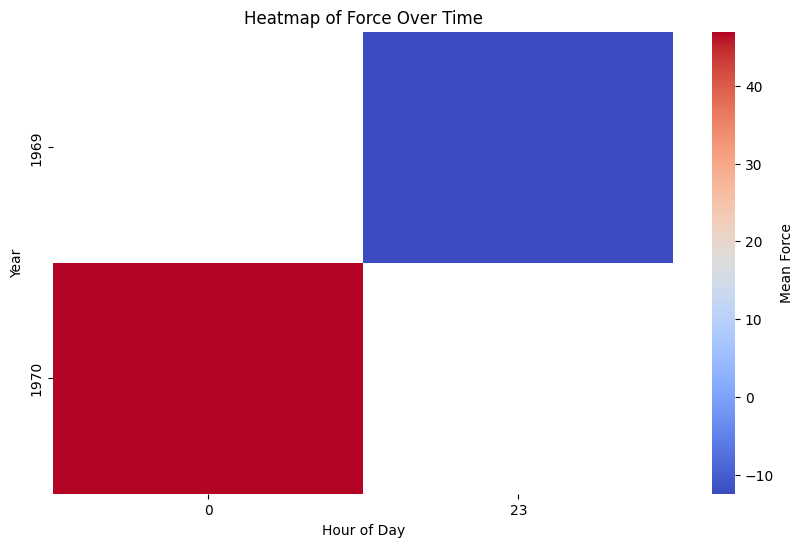

In [17]:
import numpy as np

# Criando dados fictícios para heatmap (ajuste conforme o dataset)
heatmap_data = df.pivot_table(
    values='Dyno_TractiveForce[N]',
    index=df.index.year,
    columns=df.index.hour,
    aggfunc='mean'
)

plt.figure(figsize=(10, 6))
sns.heatmap(heatmap_data, cmap='coolwarm', cbar_kws={'label': 'Mean Force'})
plt.title('Heatmap of Force Over Time')
plt.xlabel('Hour of Day')
plt.ylabel('Year')
plt.show()


In [ ]:
plt.figure(figsize=(10, 6))
sns.violinplot(data=df, y='Dyno_LoadCell[N]', x='Dyno_Spd[mph]', scale='width', inner='quartile')
plt.title('Violin Plot of Load Cell vs. Speed')
plt.xlabel('Speed [mph]')
plt.ylabel('Load Cell [N]')
plt.grid()
plt.show()


<ipython-input-18-b483f5cdee70>:2: FutureWarning: 

The `scale` parameter has been renamed and will be removed in v0.15.0. Pass `density_norm='width'` for the same effect.
  sns.violinplot(data=df, y='Dyno_LoadCell[N]', x='Dyno_Spd[mph]', scale='width', inner='quartile')


1.   Step 1: Import Necessary Libraries
2.   Step 2: Import the Dataset
3. Step 3: Visualize the Data
4. Step 4: Remove Outliers and Detect Anomalies
5. Step 5: Filter the Dataset
6. Step 6: Calculate Statistical Features
7. Step 7: Select the Most Important Features
8. Step 8: Split the Data
9. Step 9: Build the Model
10. Step 10: Evaluate the Model

In [ ]:
plt.figure(figsize=(10, 6))
sns.boxplot(data=df, y='Dyno_TractiveForce[N]', x='Dyno_Spd_Front[mph]')
plt.title('Boxplot of Tractive Force vs. Front Speed')
plt.xlabel('Front Speed [mph]')
plt.ylabel('Tractive Force [N]')
plt.grid()
plt.show()


In [ ]:
# Exemplo para criar binning de tempo e mês
df['Hour'] = df.index.hour
df['Month'] = df.index.month

heatmap_2d = df.pivot_table(
    values='Dyno_Spd[mph]',
    index='Month',
    columns='Hour',
    aggfunc='mean'
)

plt.figure(figsize=(10, 6))
sns.heatmap(heatmap_2d, cmap='viridis', cbar_kws={'label': 'Speed [mph]'})
plt.title('Heatmap of Speed Over Hour and Month')
plt.xlabel('Hour of Day')
plt.ylabel('Month')
plt.show()
